# Modifying MCMC Initial Positions

This section aims at initializing the walkers around the known paramter space to constrain HD 159062 orbital parameters in a "ball". Scattering the walkers randomly even after 11 iterations may take much longer to converge. This section follows the Orbitize! tutorial by Henry Ngo: https://orbitize.readthedocs.io/en/latest/tutorials/Modifying_MCMC_initial_positions.html

In [419]:
import numpy as np
import custom_hd159062_lnlike as custom_lnlike
from orbitize import sampler,driver,kepler,system,results,lnlike
import multiprocessing as mp
import matplotlib.pyplot as plt
from numpy import loadtxt
import pandas as pd
import pickle
from matplotlib.backends.backend_pdf import PdfPages
import corner
import pandas as pd
from astropy.time import Time

In [249]:
def M2tperi(M,P,tref):
    Tp = tref - M*P/(2*np.pi)
    return Tp #time of periastron from mean anomaly

def M2tau0(M,P,tref):
    Tp = M2tperi(M,P,tref)
    tau = Tp/P % 1
    return tau #tau from mean anomaly

def tau0(Tp,ref_epoch,P):
    return (Tp - ref_epoch)/P #fraction of orbit after tperi

def p2sma(P,m0,m1):
    return ((P/365.25)**2*(m0+m1))**(1/3) #sma in AU

def sma2p(sma,m0,m1):
    return (np.sqrt(sma**3/(m0 + m1)))*365.25 #period in days

In [250]:
#parameters for the white dwarf based on Lea's paper:
M = 144.0*np.pi/180
P = 238*365.25
wd_tref = 2452832.92

sma = p2sma(238*365.25,0.80,0.65)
ecc = 0.44
inc = 53.0*np.pi/180
argp = (-26+180)*np.pi/180
lan = (138.0+180)*np.pi/180
tau = M2tau0(M,P,wd_tref)
plx = 46.12
gamma = 934.0 #(in the K band)
sigma = 2.3 #(in the K band)
m1 = 0.65
m0 = 0.80

wd_params = [sma,ecc,inc,argp,lan,tau,plx,gamma,sigma,m1,m0]
print(wd_params)
print(M2tperi(M,P,wd_tref))
print('Period:', P)
print('Mean anomaly:',M)

[43.468431757814514, 0.44, 0.9250245035569946, 2.6878070480712677, 2.4085543677521746, 0.8163468097711366, 46.12, 934.0, 2.3, 0.65, 0.8]
2418061.12
Period: 86929.5
Mean anomaly: 2.5132741228718345


In [251]:
filename = '/Users/rtejada/Desktop/notebooks/HD159062/hd159062_mcmc.csv'

# system parameters
num_secondary_bodies = 1
system_mass = m0 # [Msol]
plx = plx # [mas]
mass_err = 0.05 # [Msol]
plx_err = 0.024 # [mas]

# MCMC parameters
num_temps = 20
num_walkers = 100
num_threads = mp.cpu_count() # or a different number if you prefer


my_driver = driver.Driver(
    filename, 'MCMC', num_secondary_bodies, system_mass, plx, mass_err=mass_err, plx_err=plx_err,
    system_kwargs = {'fit_secondary_mass':True,
                                  'tau_ref_epoch':0, 'gamma_bounds':(-5000, 5000), 'jitter_bounds':(1e-3, 50)},
    mcmc_kwargs={'num_temps': num_temps, 'num_walkers': num_walkers, 'num_threads': num_threads}
)

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input

In [252]:
s = my_driver.sampler

In [253]:
chains = pd.read_csv('/Users/rtejada/Desktop/notebooks/HD159062/samp_0temp.csv')
chains

,cosi,jit_j,jit_k,lan,lnlike,lnprob,logp,m1,m2,manom,...,off_k,para,secosw,sesinw,temp,logm2,per,ecc,argp,inc
0,0.715106,0.972748,5.857269,5.601356,194.658102,192.450067,2.265275,0.748508,0.711760,2.035371,...,534.859796,46.148410,-0.798810,0.259285,0,-0.147666,184.193862,0.705326,2.827732,0.774021
1,0.457901,1.578017,2.767363,5.473243,192.380294,188.501841,2.594441,0.810618,0.620162,4.208147,...,1492.340379,46.092618,-0.006132,0.328770,0,-0.207495,393.043825,0.108127,1.589445,1.095164
2,0.921475,2.209806,2.901356,5.810537,188.775868,187.496116,2.151939,0.796273,0.995189,1.785241,...,91.313232,46.113460,-0.819725,0.434470,0,-0.002094,141.885786,0.860713,2.654219,0.398936
3,0.878406,1.508978,6.947793,5.810539,187.391019,185.571212,2.204003,0.778809,0.813358,2.120143,...,254.093430,46.086688,-0.763615,0.439293,0,-0.089718,159.956889,0.776087,2.619547,0.498281
4,0.693423,1.786361,0.375250,5.631091,196.465976,195.986498,2.293175,0.774329,0.653415,2.001754,...,486.487242,46.141065,-0.778890,0.272335,0,-0.184811,196.415282,0.680836,2.805234,0.804567
5,0.886173,1.187360,11.137766,5.937817,193.424262,192.584041,2.223075,0.833288,0.736162,1.717029,...,16.011670,46.115844,-0.756659,0.502843,0,-0.133027,167.138024,0.825383,2.555052,0.481777
6,0.664115,1.456354,7.899835,5.686061,195.387191,193.805105,2.344610,0.864366,0.597621,2.325936,...,561.629537,46.135947,-0.667988,0.336313,0,-0.223574,221.110831,0.559314,2.675171,0.844486
7,0.494393,1.483145,5.774975,5.574683,195.548811,192.974694,2.479739,0.881946,0.573949,2.998579,...,982.821453,46.143167,-0.424337,0.341839,0,-0.241126,301.813611,0.296915,2.463456,1.053660
8,0.762505,1.284642,6.315654,5.646780,197.196076,195.352763,2.276085,0.731066,0.729537,2.105236,...,540.538073,46.137809,-0.767115,0.275940,0,-0.136953,188.836038,0.664609,2.796293,0.703620
9,0.895908,1.905894,0.415100,5.818551,193.392751,192.869949,2.199077,0.814642,0.856554,1.898089,...,199.397301,46.136550,-0.783402,0.404766,0,-0.067245,158.152992,0.777555,2.664693,0.460325


In [254]:
chains['sma'] = p2sma(chains['per']*365.25,chains['m1'],chains['m2'])

In [255]:
chains['tau'] = M2tau0(chains['manom'],chains['per'],wd_tref)

wd_params = [sma,ecc,inc,argp,lan,tau,plx,gamma,sigma,m1,m0]

In [256]:
param_cols = chains[['sma','ecc','inc','argp','lan','tau','para','off_j','jit_j','m2','m1']]
param_cols.head()

,sma,ecc,inc,argp,lan,tau,para,off_j,jit_j,m2,m1
0,36.727752,0.705326,0.774021,2.827732,5.601356,0.259461,46.148410,532.034851,0.972748,0.711760,0.748508
1,60.462330,0.108127,1.095164,1.589445,5.473243,0.939483,46.092618,1487.405394,1.578017,0.620162,0.810618
2,33.039123,0.860713,0.398936,2.654219,5.810537,0.091820,46.113460,94.170814,2.209806,0.995189,0.796273
3,34.408428,0.776087,0.498281,2.619547,5.810539,0.000065,46.086688,255.895243,1.508978,0.813358,0.778809
4,38.048164,0.680836,0.804567,2.805234,5.631091,0.675672,46.141065,486.464272,1.786361,0.653415,0.774329


In [257]:
param_cols['argp'] = param_cols['argp'] % 2*np.pi

/Users/rtejada/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


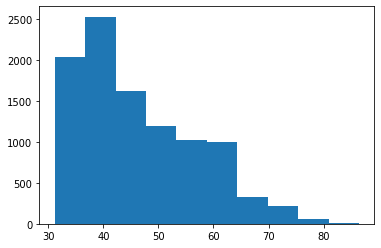

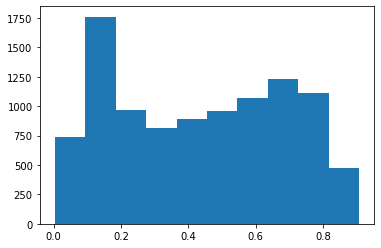

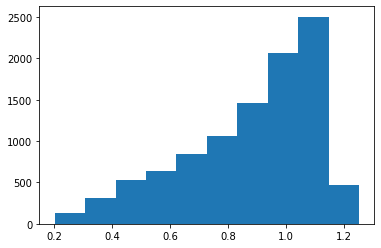

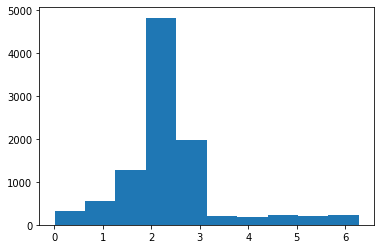

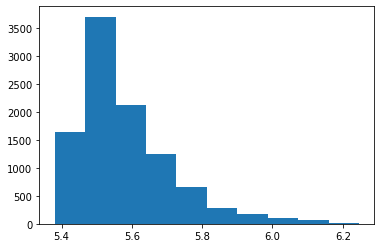

...

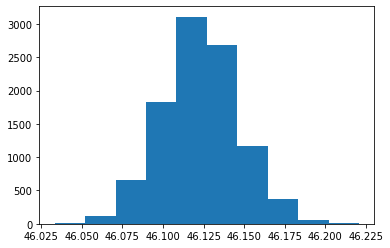

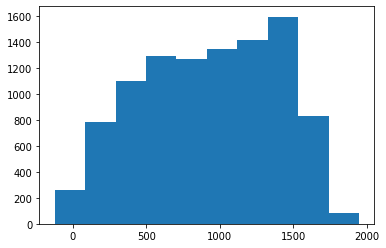

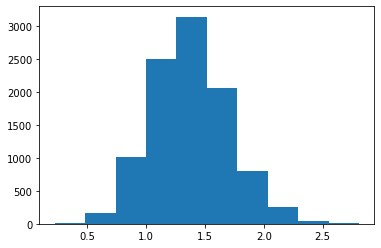

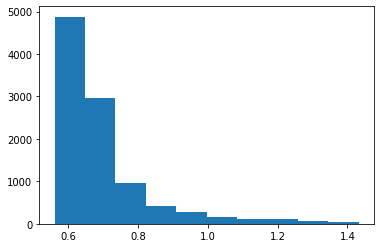

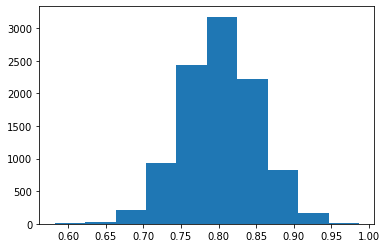

In [258]:
for p in range(11):
    plt.hist(param_cols[param_cols.columns.values[p]])
    plt.show()

In [259]:
param_cols.shape

(10000, 11)

In [260]:
param_cols.values.tolist()

[[36.7277524986288,
  0.705325951476,
  0.774020562879,
  2.600397389454851,
  5.601356142059998,
  0.2594611560798512,
  46.1484102479,
  532.0348513490001,
  0.972747660649,
  0.711760195846,
  0.7485084271060001],
 [60.46232959312201,
  0.108127166795,
  1.09516395539,
  4.993389184784106,
  5.47324336414,
  0.9394830900537272,
  46.092618136800006,
  1487.40539387,
  1.5780169382799998,
  0.620161541896,
  0.810617845343],
 [33.039123168010676,
  0.860713187668,
  0.398935899705,
  2.055288651959296,
  5.810537170519999,
  0.09182034357945668,
  46.1134601849,
  94.1708144733,
  2.20980575036,
  0.995189498339,
  0.796273158856],
 [34.4084279008405,
  0.776086506953,
  0.498280775814,
  1.9463654172596954,
  5.81053939248,
  6.530312020913698e-05,
  46.0866877741,
  255.895243156,
  1.50897804773,
  0.8133578979330001,
  0.7788090119059999],
 [38.04816418845293,
  0.680835600217,
  0.804567025869,
  2.529715836080133,
  5.63109069822,
  0.6756722472655383,
  46.1410651806,
  486.46

In [261]:
orbits_reshaped = np.reshape(param_cols.values.tolist(),(20,-1,11))

In [262]:
np.shape(orbits_reshaped)

(20, 500, 11)

In [263]:
np.median(orbits_reshaped[:,:,-1])
print(np.percentile(orbits_reshaped[:,:,-1],[16,50,84]))

[0.75362307 0.80213027 0.85139897]


In [264]:
for p in range(11):
    print(np.percentile(orbits_reshaped[:,:,p],[16,50,84]))

[35.82174413 43.42628819 58.81274475]
[0.13135634 0.44018554 0.72625432]
[0.62069063 0.9384008  1.09604065]
[1.68019123 2.31933874 2.73447409]
[5.46651658 5.54357324 5.69903517]
[0.1668039  0.5027322  0.84321537]
[46.09961502 46.12293119 46.14568911]
[ 402.48797966  959.83625199 1444.05334933]
[1.05604235 1.36219446 1.69132766]
[0.60728872 0.64976549 0.77654518]
[0.75362307 0.80213027 0.85139897]


In [265]:
s.curr_pos = orbits_reshaped[:,:100,:]

In [266]:
print(s.curr_pos[9,:,0].min())
print(s.curr_pos[9,:,0].max())

31.827320706433373
76.75924073523915


In [267]:
my_driver.sampler.curr_pos.shape

(20, 100, 11)

In [268]:
total_orbits = 500000 # number of steps x number of walkers (at lowest temperature)
burn_steps = 100 # steps to burn in per walker
thin = 50# only save every 10th step

Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 0 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 1 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 2 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 3 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 4 iterations!


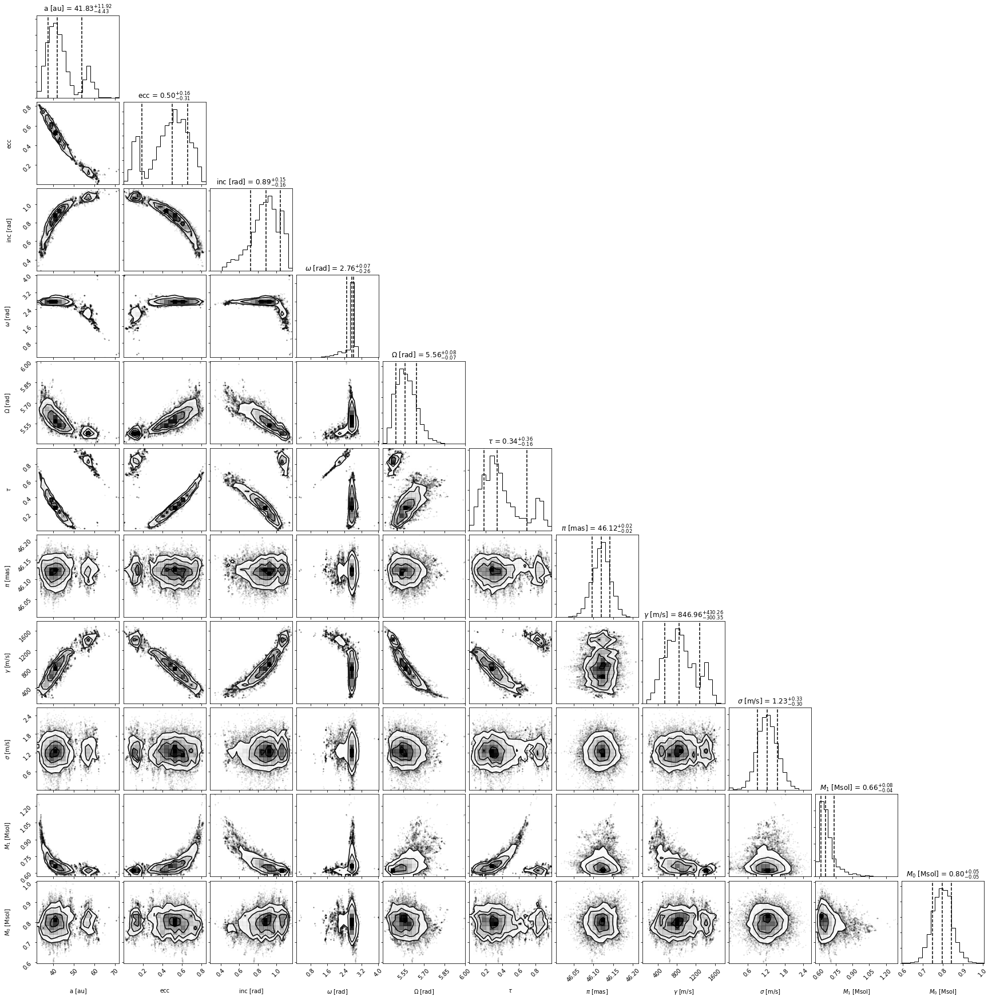

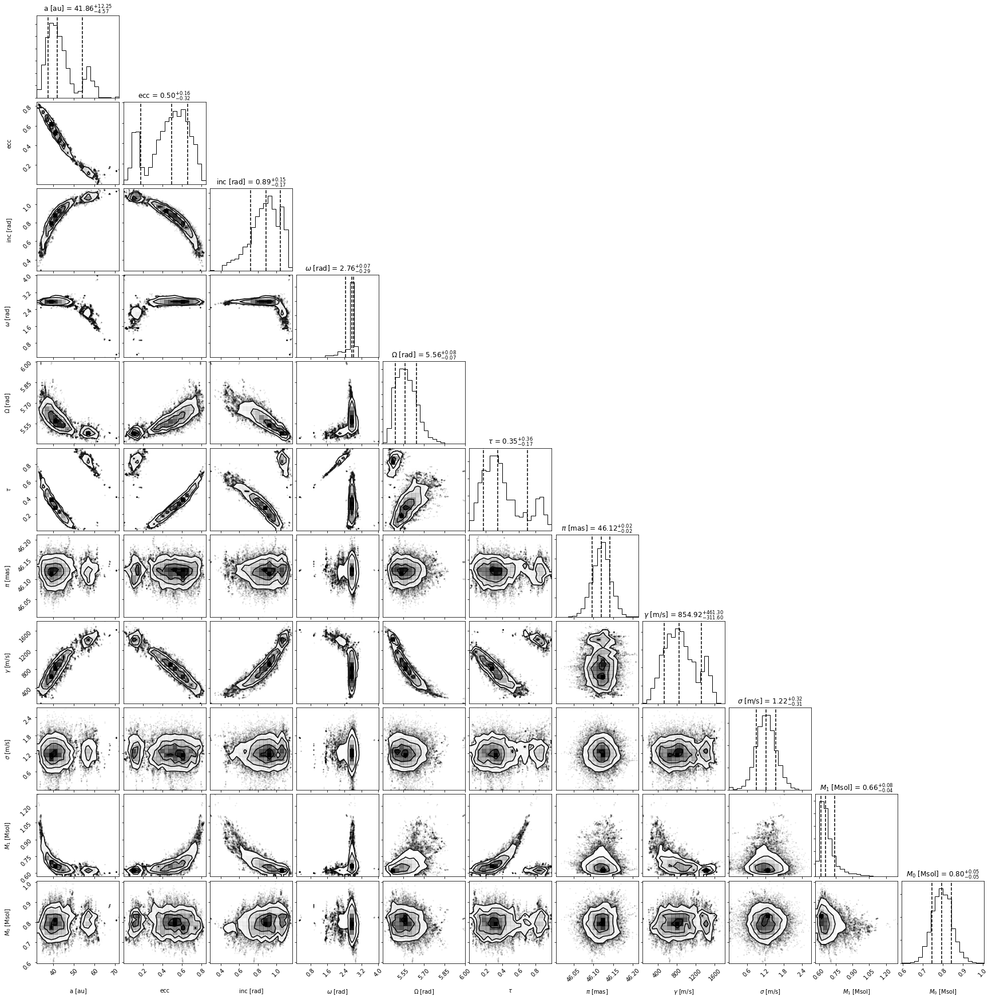

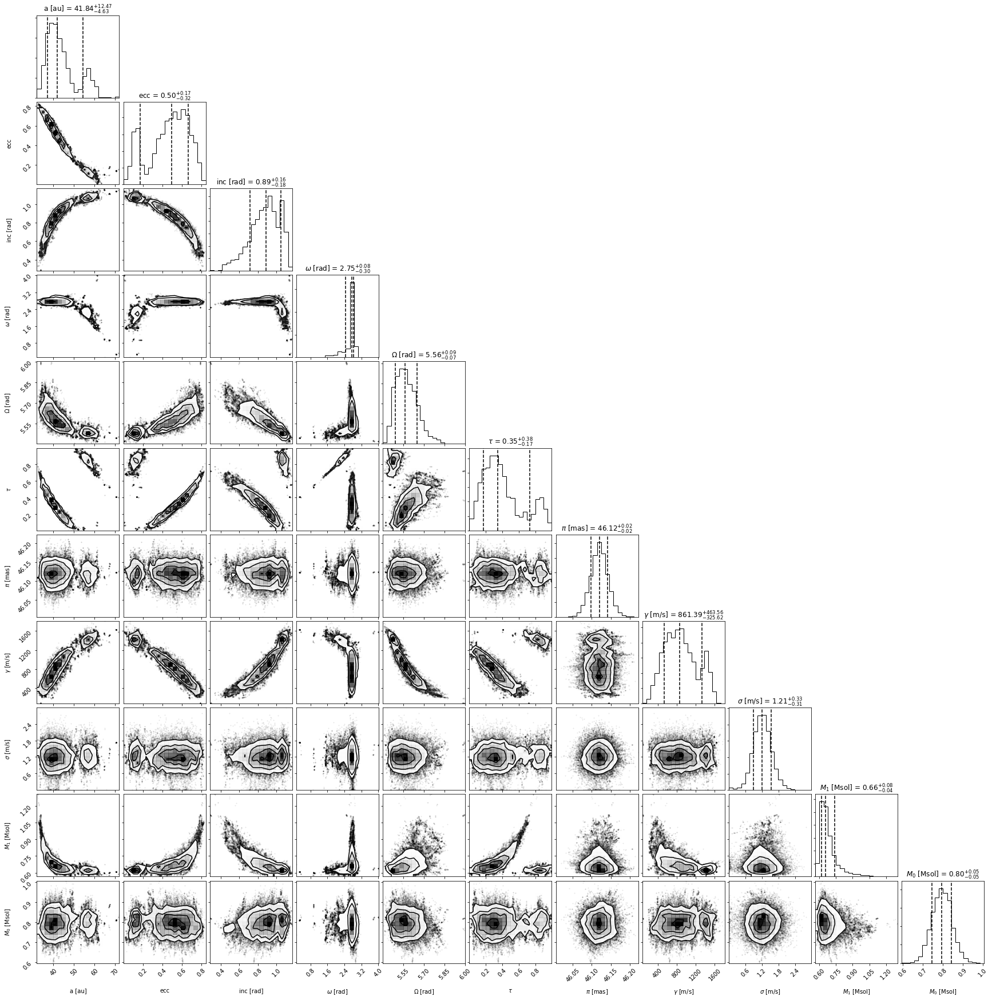

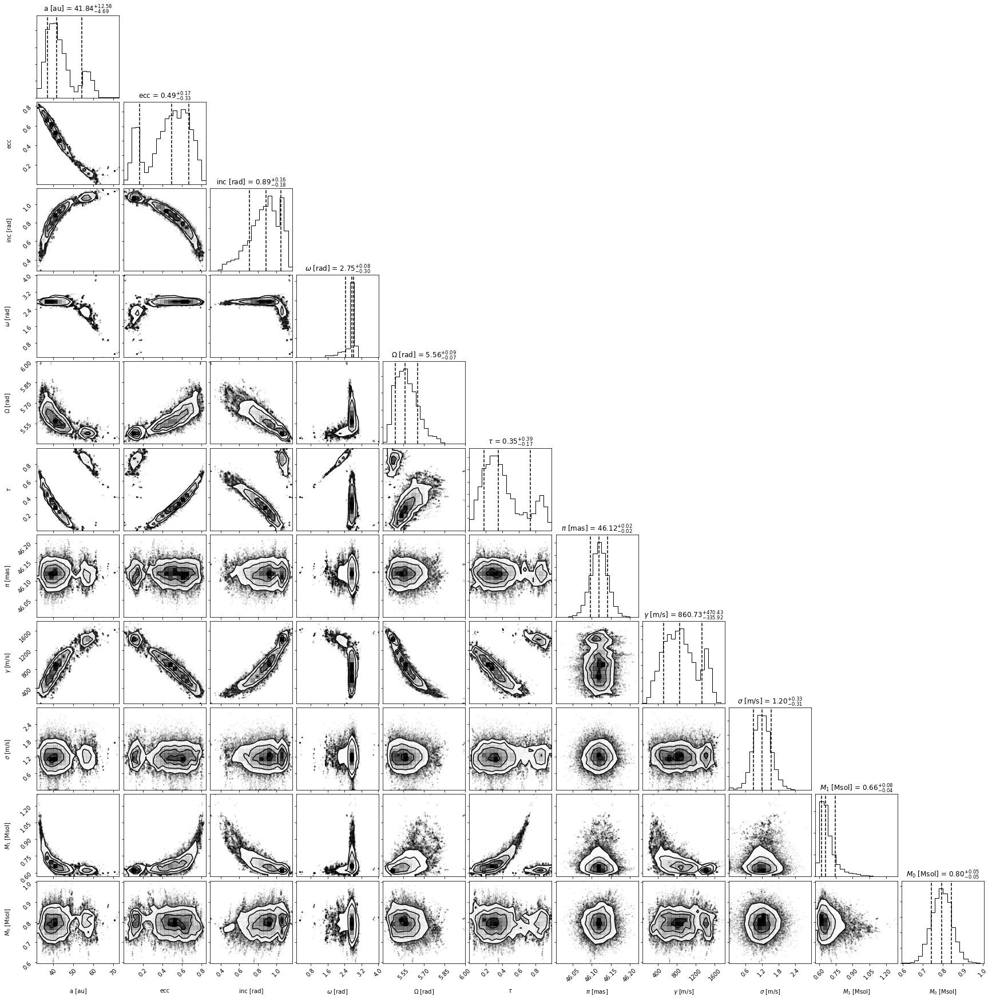

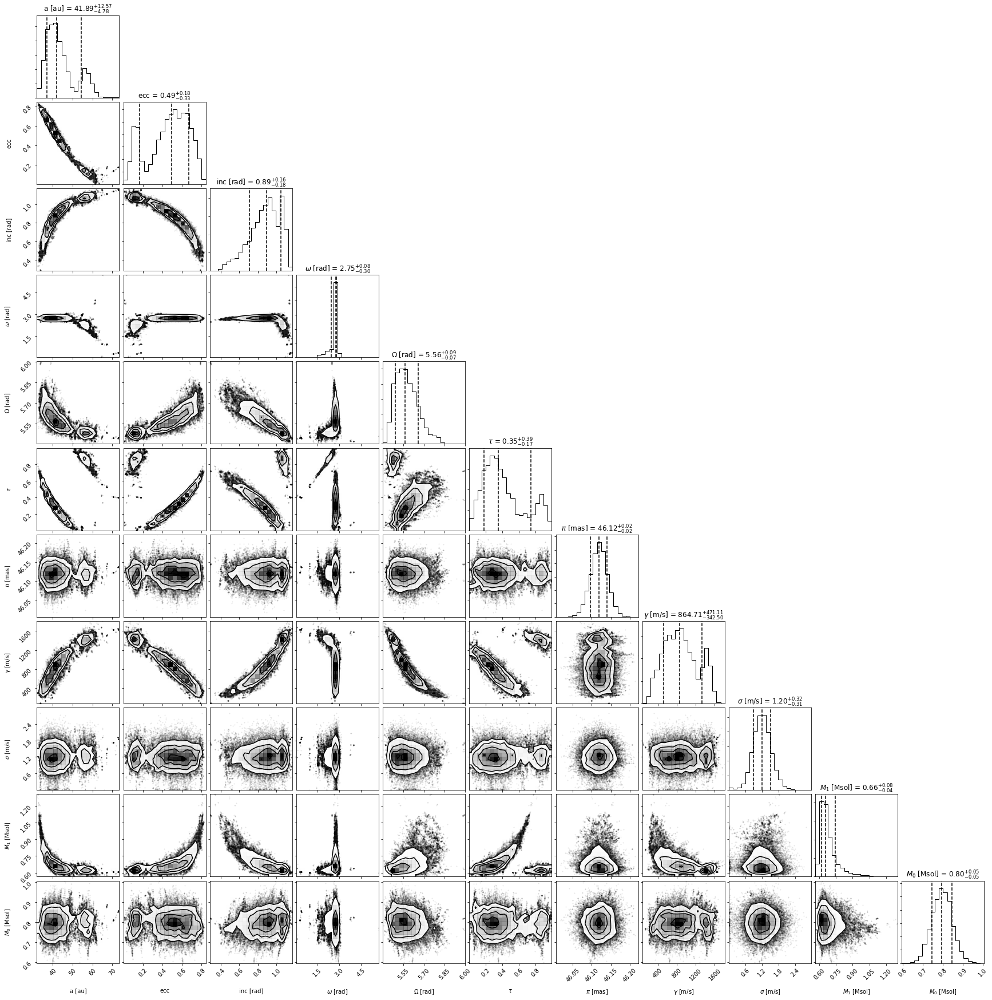

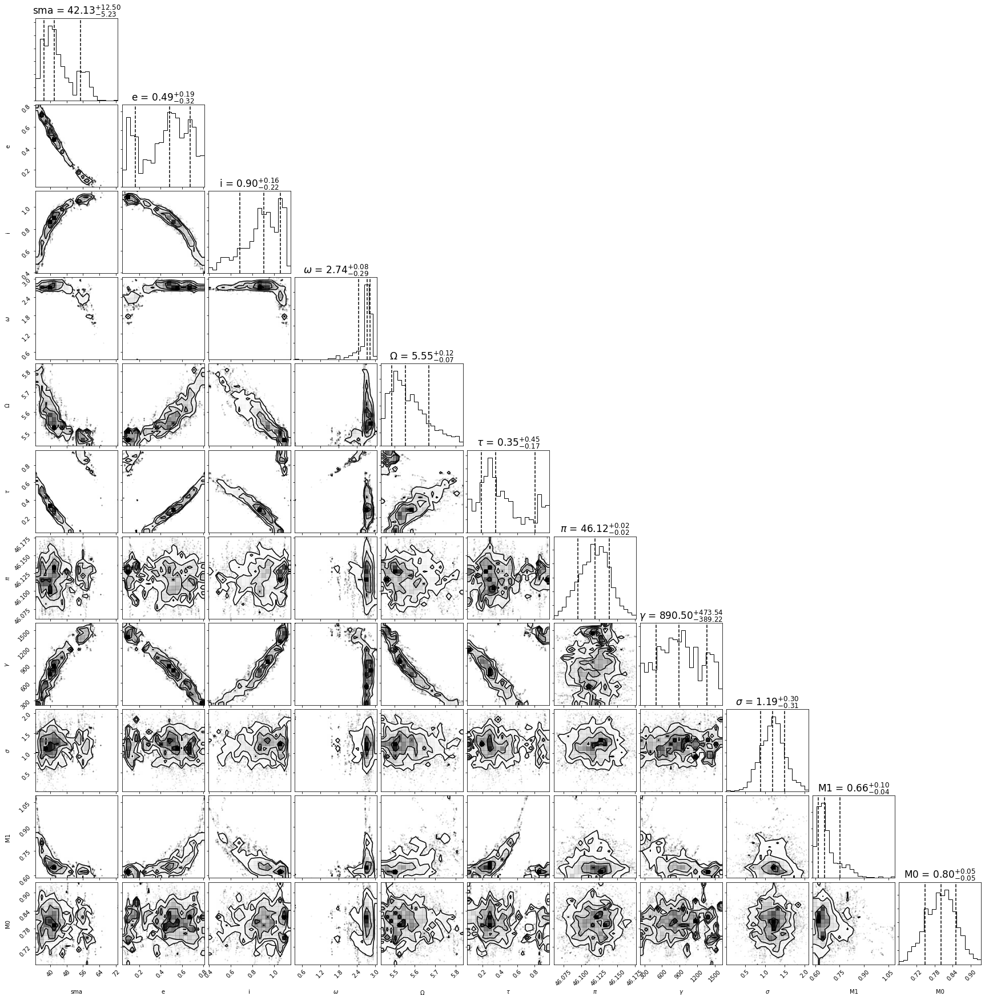

Process ForkPoolWorker-121:
Process ForkPoolWorker-122:
Process ForkPoolWorker-123:
Process ForkPoolWorker-124:
Process ForkPoolWorker-126:
Process ForkPoolWorker-125:
Process ForkPoolWorker-128:
Process ForkPoolWorker-127:
Process ForkPoolWorker-119:
Process ForkPoolWorker-117:
Process ForkPoolWorker-120:
Process ForkPoolWorker-118:
Process ForkPoolWorker-132:
Process ForkPoolWorker-131:
Process ForkPoolWorker-130:
Process ForkPoolWorker-129:
Process ForkPoolWorker-133:
Process ForkPoolWorker-134:
Process ForkPoolWorker-135:
Process ForkPoolWorker-136:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line

KeyboardInterrupt
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/connection.py", line 407, in _recv_bytes
    buf = self._recv(4)
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/queues.py", line 351, in get
    with self._rlock:
  File "

In [270]:
path = '/Users/rtejada/Desktop/notebooks/HD159062/'
param_names = ['sma','e','i','$\omega$','$\Omega$','$\\tau$','$\pi$','$\gamma$',
               '$\sigma$','M1','M0']
for i in range(5):
    #running the sampler:
    my_driver.sampler.run_sampler(total_orbits, burn_steps=0, thin=thin)
    chain = my_driver.sampler.chain
    print('The chain shape is:',np.shape(chain))
    #saving each sampler chainL
    pkl_file = open(path + 'hd159062_mcmcchains_run%1d_init_pos0.txt' % i,'wb')
    pickle.dump(chain,pkl_file)
    
    #plotting and saving corner plots:
    corner_plot_fig = my_driver.sampler.results.plot_corner(show_titles=True,
                                     quantiles=[0.16,0.5,0.84]) # Creates a corner plot and returns Figure object
    corner_plot_fig.savefig(path + 'hd159062_cornerplot%1d_init_pos0.pdf' % i)
    
    for j in range(15):
        with PdfPages(path+'walkers_hd159062_mcmc%1d_temps%1d_init_pos0.pdf' % (i,j)) as pdf:
            shape = np.shape(chain)
            num_steps = shape[2]
            num_params = shape[3]
            num_walkers = shape[1]
            for p in range(num_params):
                pname = param_names[p]
                fig = plt.figure(figsize = (8,5))
                for x in range(num_walkers):
                    #makes trend plot
                    plt.plot(range(num_steps),my_driver.sampler.chain[j,x,:,p],alpha=0.7,linewidth=2)
                    plt.axhline(wd_params[p],ls='--',c='k')
                plt.ylabel(pname)
                plt.xlabel('steps')
                plt.minorticks_on()
                pdf.savefig()
                #plt.show()
                plt.close()
    print('Finished with %1d iterations!' % i)
                
flatchain = np.reshape(chain[0],(-1,11))
corner_fig = corner.corner(flatchain,labels = param_names,quantiles=[0.16,0.5,0.84],
                          show_titles=True,range=np.ones(len(param_names))*0.99,title_kwargs={"fontsize": 17})
corner_fig.savefig(path + 'hd159062_flatchain_cornerplot_init_pos0.pdf')

In [368]:
plt.rc('font',family='serif',size=18)
plt.rc('text',usetex=True)

In [345]:
params_4poster = ['sma','e','i','$\omega$','$\Omega$','$\\tau$']

In [346]:
np.shape(flatchain)

(10000, 11)

In [356]:
mod_flatchain = pd.DataFrame(flatchain[:,:6],columns=params_4poster)
np.shape(mod_flatchain)

(10000, 6)

In [357]:
print(mod_flatchain)

            sma         e         i  $\omega$  $\Omega$    $\tau$
0     41.777467  0.532502  0.862259  2.786185  5.628757  0.257722
1     37.428925  0.637013  0.707191  2.788967  5.624231  0.421589
2     35.650523  0.721496  0.710546  2.797067  5.611826  0.533432
3     54.429709  0.175223  1.024434  2.187676  5.500073  0.853666
4     49.383552  0.295499  1.027727  2.566470  5.537161  0.031208
5     41.883297  0.484260  0.932507  2.707693  5.552828  0.228627
6     33.590252  0.784613  0.518264  2.793276  5.637997  0.663155
7     35.944992  0.675232  0.731551  2.870243  5.537155  0.523780
8     43.486956  0.431775  0.918272  2.856097  5.537963  0.245891
9     36.020208  0.750651  0.538307  2.747060  5.757309  0.542388
10    51.579451  0.241973  0.998079  2.641439  5.562039  0.013981
11    35.598021  0.708920  0.644786  2.761063  5.646915  0.520556
12    37.518541  0.647279  0.696774  2.806076  5.633694  0.429460
13    42.355949  0.466877  0.937999  2.771204  5.541567  0.219194
14    46.6

In [358]:
m0_pred = pd.DataFrame(flatchain[:,-2])

In [359]:
mod_flatchain.insert(loc=0,column='M1',value=m0_pred)

In [360]:
mod_flatchain

,M1,sma,e,i,$\omega$,$\Omega$,$\tau$
0,0.626755,41.777467,0.532502,0.862259,2.786185,5.628757,0.257722
1,0.749724,37.428925,0.637013,0.707191,2.788967,5.624231,0.421589
2,0.764605,35.650523,0.721496,0.710546,2.797067,5.611826,0.533432
3,0.635761,54.429709,0.175223,1.024434,2.187676,5.500073,0.853666
4,0.607179,49.383552,0.295499,1.027727,2.566470,5.537161,0.031208
5,0.646052,41.883297,0.484260,0.932507,2.707693,5.552828,0.228627
6,1.003350,33.590252,0.784613,0.518264,2.793276,5.637997,0.663155
7,0.846848,35.944992,0.675232,0.731551,2.870243,5.537155,0.523780
8,0.652662,43.486956,0.431775,0.918272,2.856097,5.537963,0.245891
9,0.798844,36.020208,0.750651,0.538307,2.747060,5.757309,0.542388


In [361]:
list(mod_flatchain.columns)

['M1', 'sma', 'e', 'i', '$\\omega$', '$\\Omega$', '$\\tau$']

In [362]:
print(np.shape(mod_flatchain))

(10000, 7)


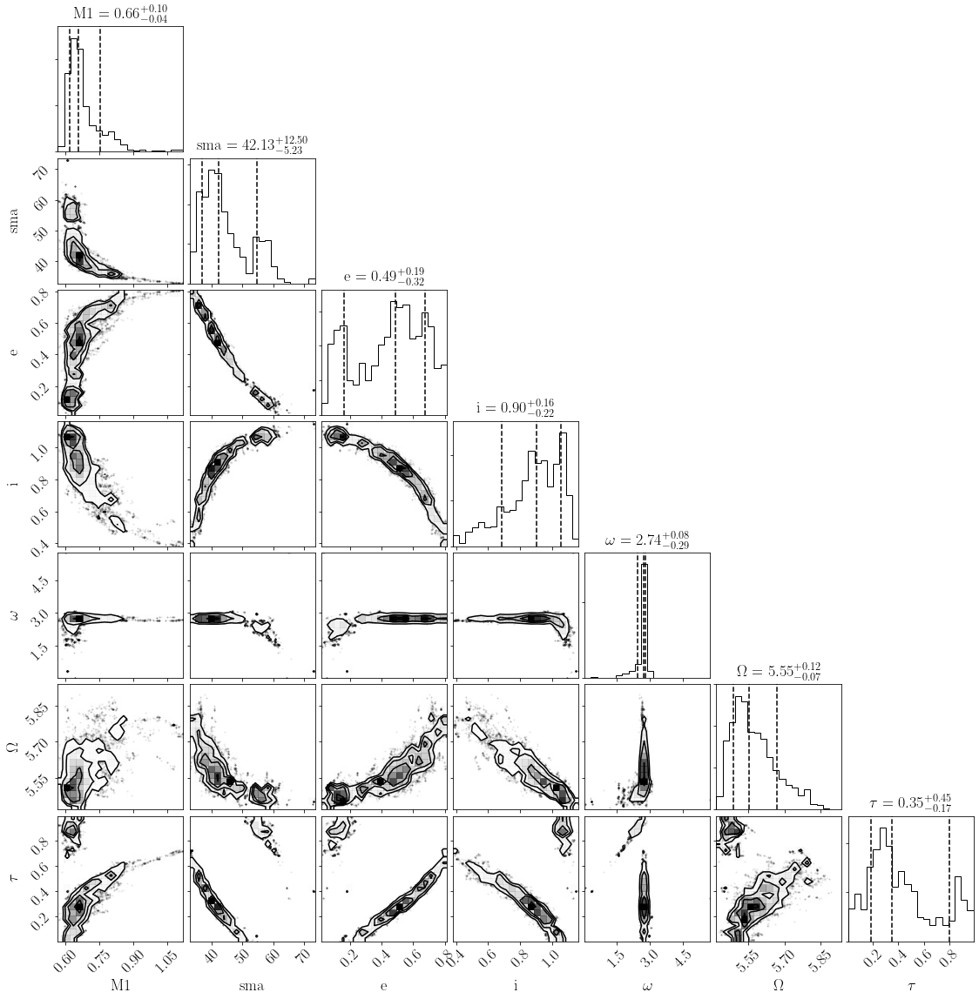

In [370]:
corner_fig = corner.corner(mod_flatchain,labels = list(mod_flatchain.columns),
                           quantiles=[0.16,0.5,0.84],
                          show_titles=True,
                           #range=np.ones(len(list(mod_flatchain.columns)))*0.99,
                           title_kwargs={"fontsize": 18})
corner_fig.savefig('/Users/rtejada/Desktop/cornerplot_4poster.pdf')

# Including our Custom Likelihood with Defined Initial Positions of MCMC

In [376]:
filename = '/Users/rtejada/Desktop/notebooks/HD159062/hd159062_mcmc.csv'

# system parameters
num_secondary_bodies = 1
system_mass = m0 # [Msol]
plx = plx # [mas]
mass_err = 0.05 # [Msol]
plx_err = 0.024 # [mas]

# MCMC parameters
num_temps = 20
num_walkers = 100
num_threads = mp.cpu_count() # or a different number if you prefer


my_mcmc = driver.Driver(
    filename, 'MCMC', num_secondary_bodies, system_mass, plx, mass_err=mass_err, plx_err=plx_err,
    system_kwargs = {'fit_secondary_mass':True,
                                  'tau_ref_epoch':0, 'gamma_bounds':(-5000, 5000), 'jitter_bounds':(1e-3, 50)},
    mcmc_kwargs={'num_temps': num_temps, 'num_walkers': num_walkers, 'num_threads': num_threads}
)

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input epochs from JD to MJD.

Converting input

In [383]:
#attempt at adding our custom log-likelihood:
my_mcmc.sampler.custom_lnlike=custom_lnlike.custom_chi2_loglike

In [384]:
m = my_mcmc.sampler
m.curr_pos = orbits_reshaped[:,:100,:]

In [385]:
my_mcmc.sampler.curr_pos.shape

(20, 100, 11)

Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnpro

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)


Finished with 0 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 1 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 2 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 3 iterations!
Burn in complete


/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.sin(element_array)/normalization)
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:217: RuntimeWarning: invalid value encountered in log
  lnprob = -np.log((element_array*normalizer))
/Users/rtejada/orbitize/orbitize/priors.py:326: RuntimeWarning: invalid value encountered in log
  lnprob = np.log(np.si

5000/5000 steps completed
Run complete
The chain shape is: (20, 100, 100, 11)
Finished with 4 iterations!


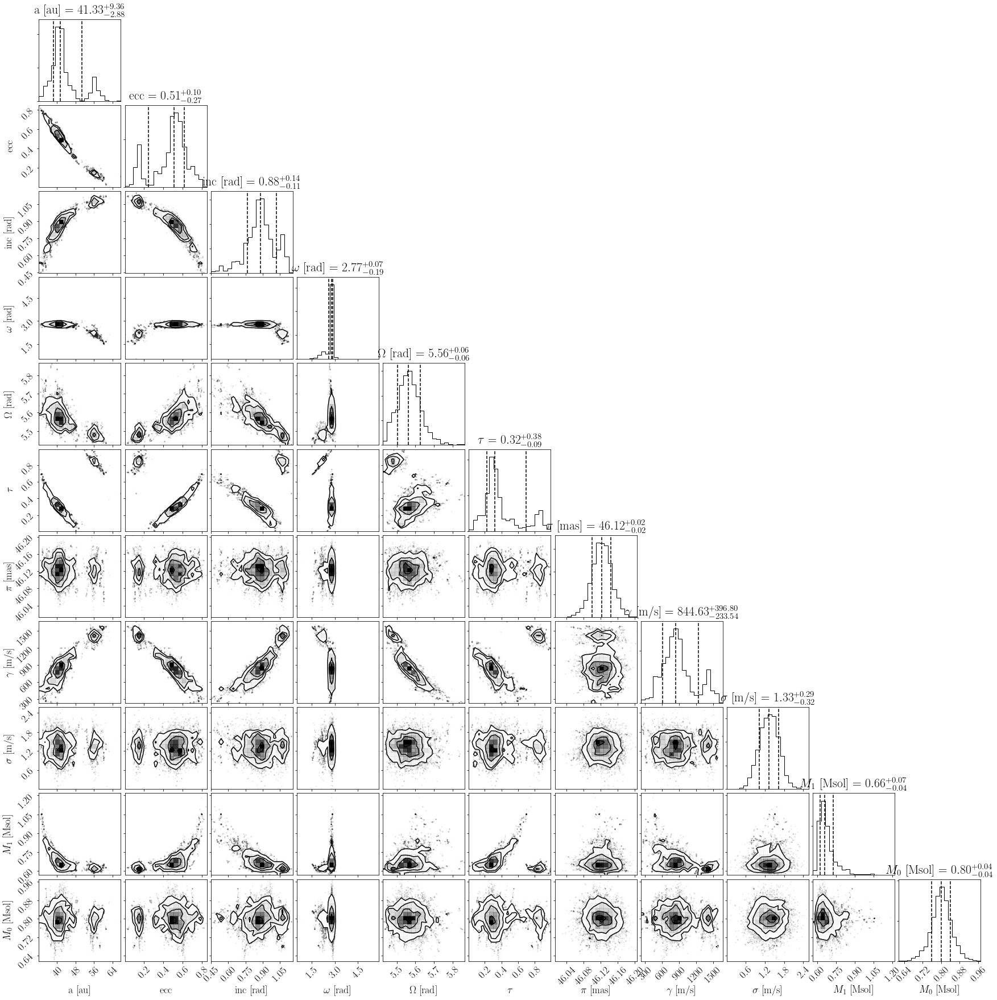

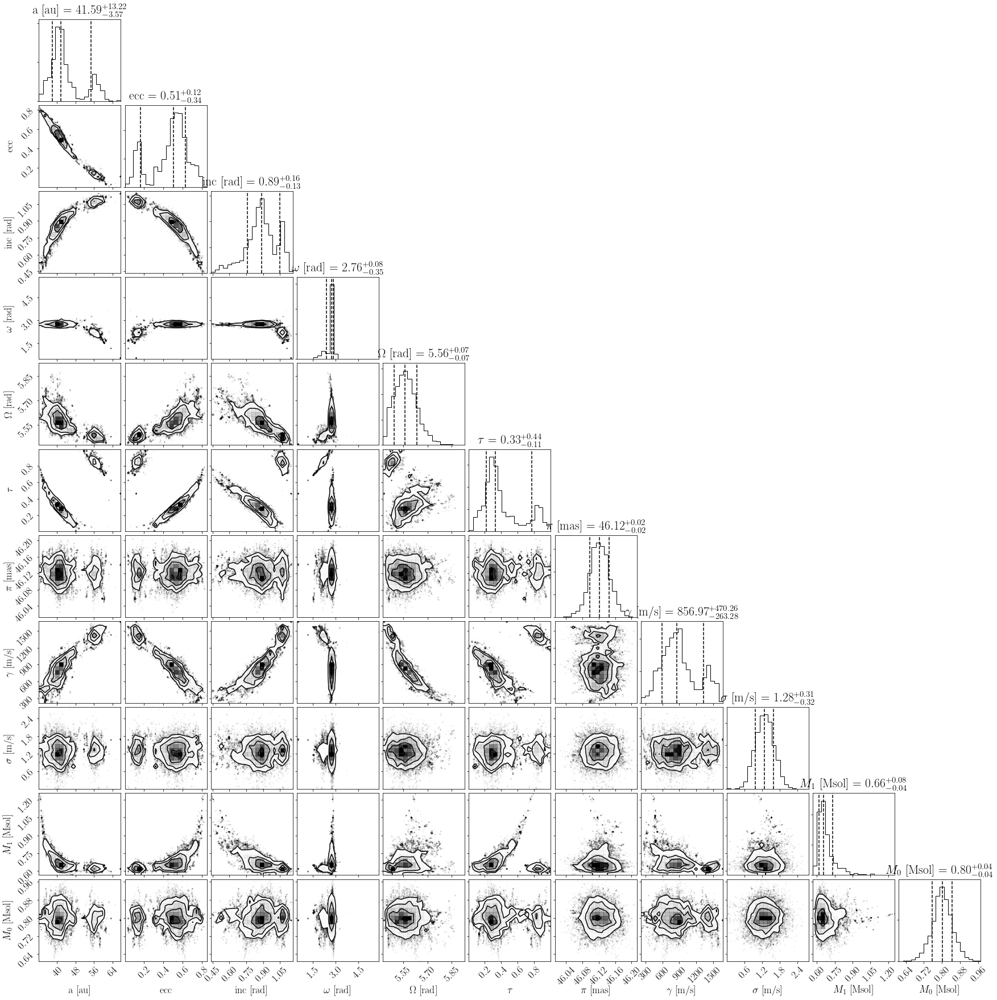

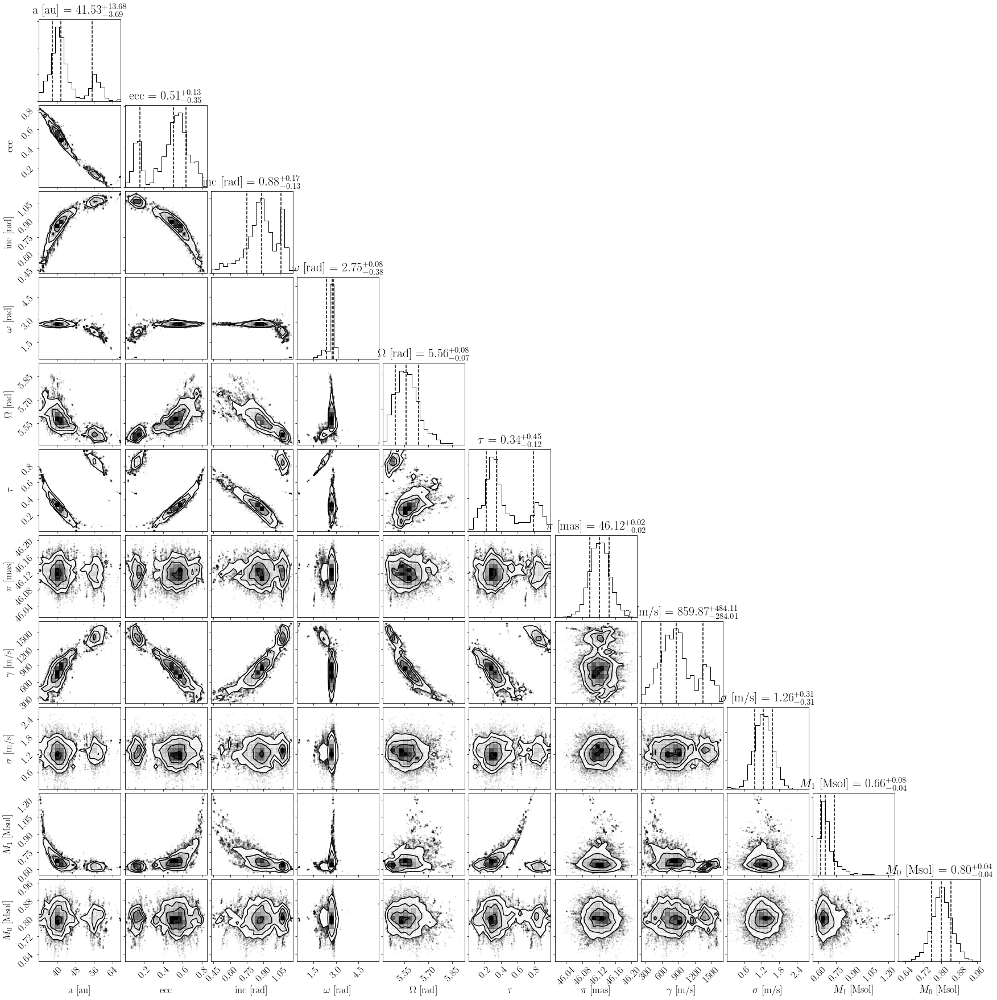

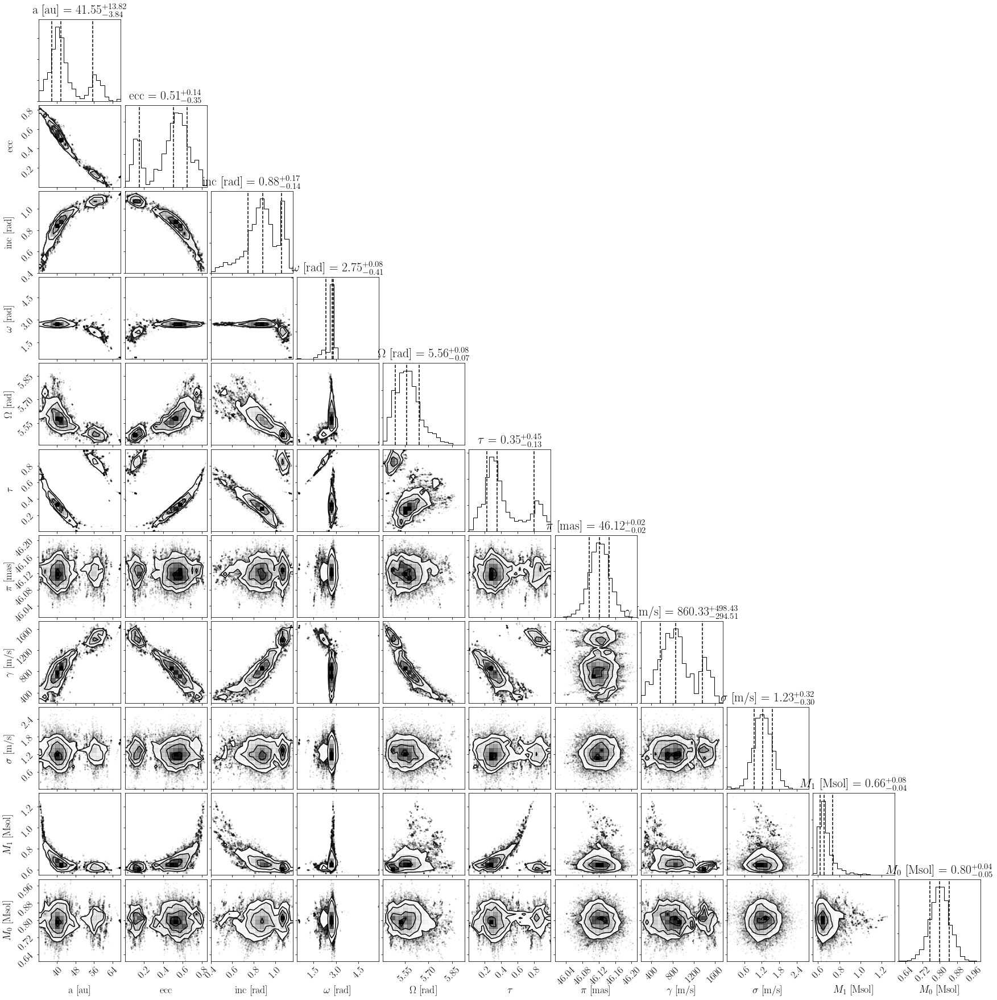

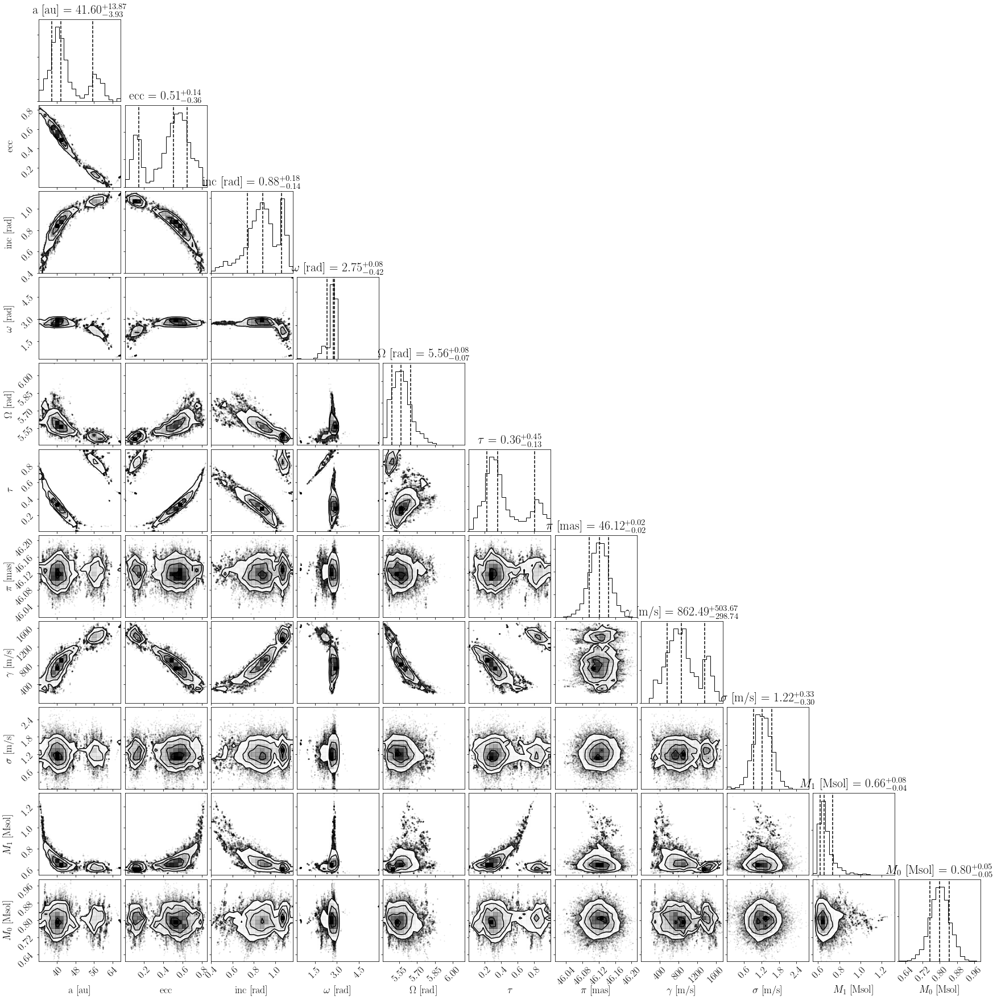

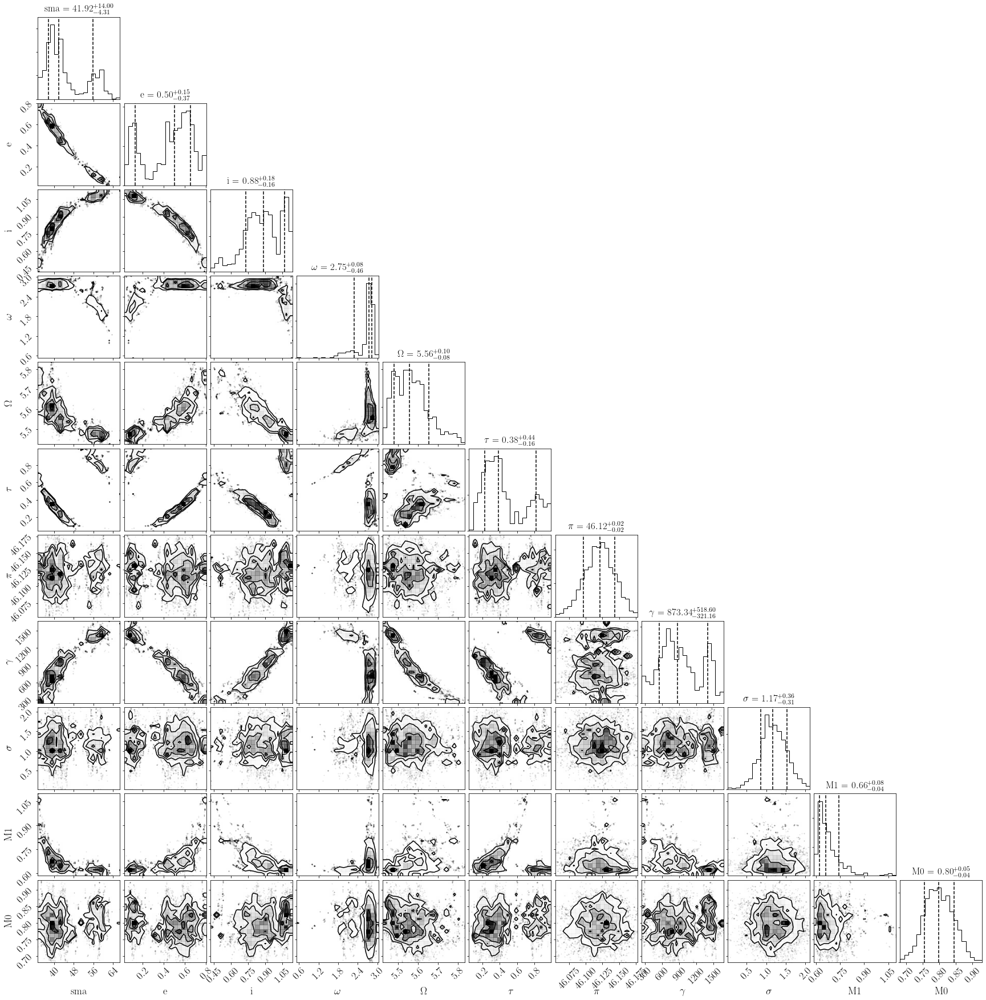

Process ForkPoolWorker-138:
Process ForkPoolWorker-137:
Process ForkPoolWorker-154:
Process ForkPoolWorker-139:
Process ForkPoolWorker-140:
Process ForkPoolWorker-148:
Process ForkPoolWorker-146:
Process ForkPoolWorker-147:
Process ForkPoolWorker-145:
Process ForkPoolWorker-144:
Process ForkPoolWorker-150:
Process ForkPoolWorker-143:
Process ForkPoolWorker-142:
Process ForkPoolWorker-141:
Process ForkPoolWorker-151:
Process ForkPoolWorker-149:
Process ForkPoolWorker-152:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
Traceback (most recent c

  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 297, in _bootstrap
    self.run()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/process.py", line 99, in run
    self._target(*self._args, **self._kwargs)
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/pool.py", line 110, in worker
    task = get()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/queues.py", line 351, in get
    with self._rlock:
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/synchronize.py", line 95, in __enter__
    return self._semlock.__enter__()
KeyboardInterrupt
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/queues.py", line 352, in get
    res = self._reader.recv_bytes()
  File "/Users/rtejada/anaconda3/lib/python3.7/multiprocessing/connection.py", line 216, in recv_bytes
    buf = self._recv_byte

In [387]:
path = '/Users/rtejada/Desktop/notebooks/HD159062/'
param_names = ['sma','e','i','$\omega$','$\Omega$','$\\tau$','$\pi$','$\gamma$',
               '$\sigma$','M1','M0']
for i in range(5):
    #running the sampler:
    my_mcmc.sampler.run_sampler(total_orbits, burn_steps=0, thin=thin)
    chain = my_mcmc.sampler.chain
    print('The chain shape is:',np.shape(chain))
    #saving each sampler chainL
    pkl_file = open(path + 'hd159062_mcmcchains_run%1d_init_pos0_wclike.txt' % i,'wb')
    pickle.dump(chain,pkl_file)
    
    #plotting and saving corner plots:
    corner_plot_fig = my_mcmc.sampler.results.plot_corner(show_titles=True,
                                     quantiles=[0.16,0.5,0.84]) # Creates a corner plot and returns Figure object
    corner_plot_fig.savefig(path + 'hd159062_cornerplot%1d_init_pos0_wclike.pdf' % i)
    
    for j in range(15):
        with PdfPages(path+'walkers_hd159062_mcmc%1d_temps%1d_init_pos0_wclike.pdf' % (i,j)) as pdf:
            shape = np.shape(chain)
            num_steps = shape[2]
            num_params = shape[3]
            num_walkers = shape[1]
            for p in range(num_params):
                pname = param_names[p]
                fig = plt.figure(figsize = (8,5))
                for x in range(num_walkers):
                    #makes trend plot
                    plt.plot(range(num_steps),my_mcmc.sampler.chain[j,x,:,p],
                             alpha=0.7,linewidth=2)
                    plt.axhline(wd_params[p],ls='--',c='k')
                plt.ylabel(pname)
                plt.xlabel('steps')
                plt.minorticks_on()
                pdf.savefig()
                #plt.show()
                plt.close()
    print('Finished with %1d iterations!' % i)
                
flatchain = np.reshape(chain[0],(-1,11))
corner_fig = corner.corner(flatchain,labels = param_names,quantiles=[0.16,0.5,0.84],
                          show_titles=True,range=np.ones(len(param_names))*0.99,title_kwargs={"fontsize": 17})
corner_fig.savefig(path + 'hd159062_flatchain_cornerplot_init_pos0_wclike.pdf')

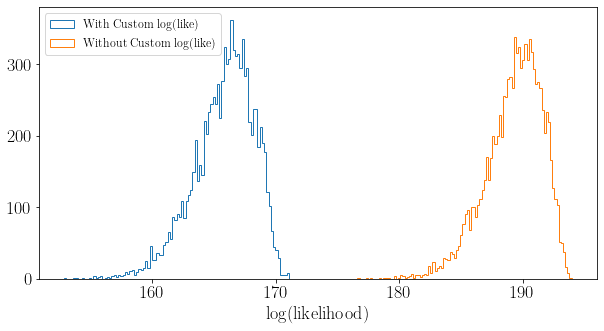

In [409]:
plt.figure(figsize=(10,5))
plt.hist(m.lnlikes,bins=100,histtype='step',label='With Custom $\log(\mathrm{like})$')
plt.hist(s.lnlikes,bins=100,histtype='step',label='Without Custom $\log(\mathrm{like})$')
plt.xlabel('$\log(\mathrm{likelihood})$')
plt.legend(loc='upper left',prop={'size': 12})
plt.show()

In [410]:
mod_flatchain2 = pd.DataFrame(flatchain[:,:6],columns=params_4poster)
m0_pred2 = pd.DataFrame(flatchain[:,-2])
mod_flatchain2.insert(loc=0,column='M1',value=m0_pred)

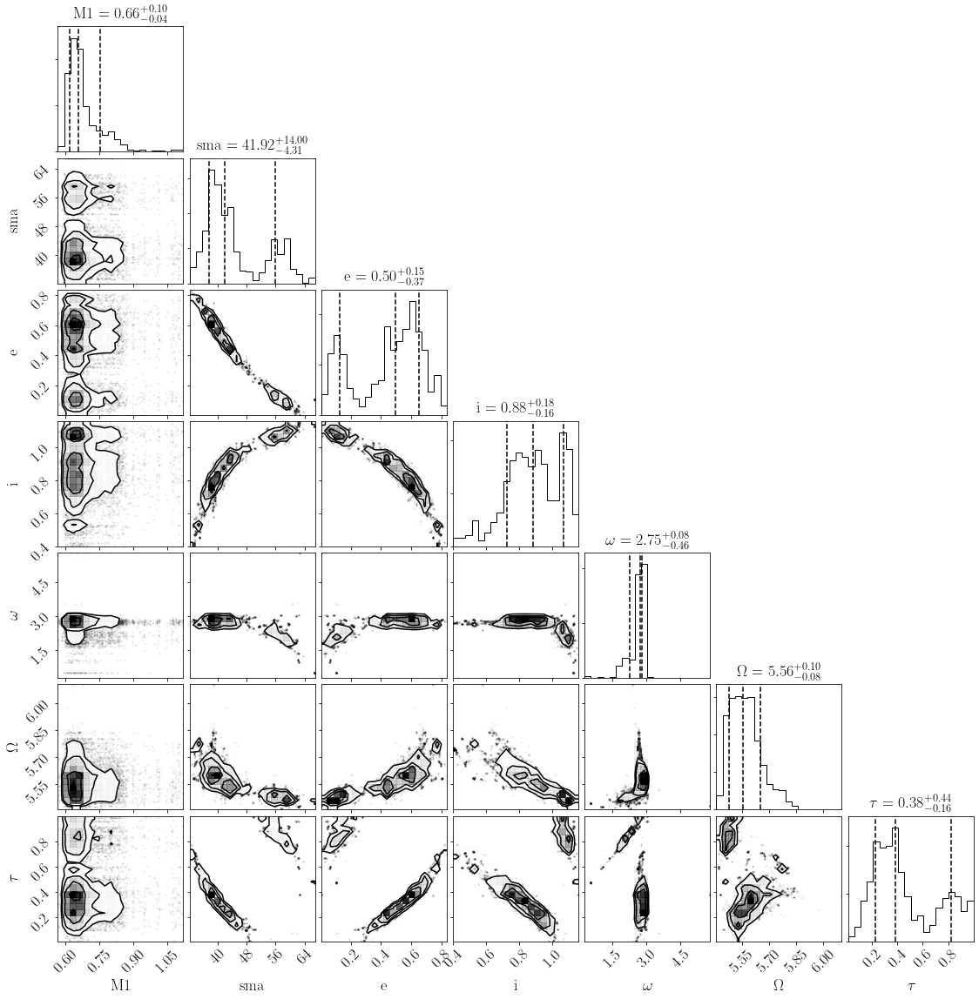

In [411]:
corner_fig2 = corner.corner(mod_flatchain2,labels = list(mod_flatchain2.columns),
                           quantiles=[0.16,0.5,0.84],
                          show_titles=True,
                           #range=np.ones(len(list(mod_flatchain.columns)))*0.99,
                           title_kwargs={"fontsize": 18})
corner_fig2.savefig('/Users/rtejada/Desktop/cornerplot_4poster_wclike.pdf')

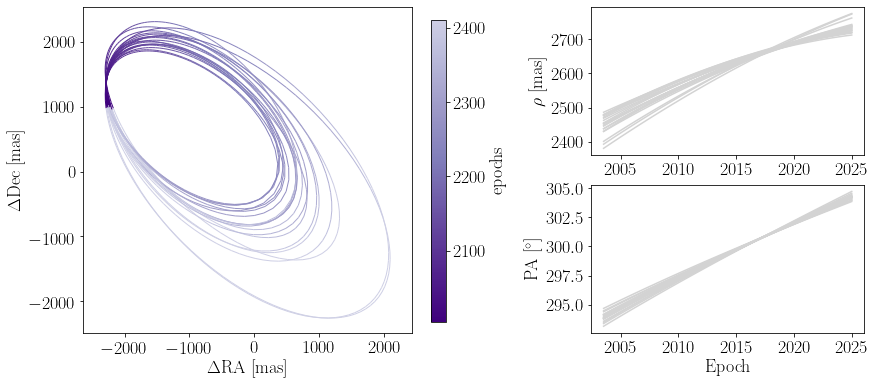

In [424]:
epochs = my_mcmc.system.data_table['epoch']

orbit_figure = m.results.plot_orbits(
    start_mjd=epochs[0], # Minimum MJD for colorbar (here we choose first data epoch)
    num_orbits_to_plot=20
)
ax_orb, ax_cbar, ax_sep, ax_pa  = orbit_figure.axes

In [425]:
epochs_yr = Time(epochs, format='mjd').decimalyear
sep = my_mcmc.system.data_table['quant1'] ; sep_err = my_mcmc.system.data_table['quant1_err']
pa = my_mcmc.system.data_table['quant2'] ; pa_err = my_mcmc.system.data_table['quant2_err']

In [433]:
orbit_figure.suptitle('HD 159062: 20 Orbits - MCMC Results With RV Data')
ax_orb.plot(0,0,marker="*",color='black',markersize=10)
ax_orb.set_xlabel('$\Delta$ RA [mas]')
ax_orb.set_ylabel('$\Delta$ DEC [mas]')
ax_orb.invert_xaxis()
ax_orb.set_xlim(-5000,5000)
ax_orb.set_ylim(-5000,5000)
ax_sep.set_ylim(2300,2800)
ax_orb.minorticks_on()
ax_pa.errorbar(epochs_yr,pa,pa_err,color='purple',linestyle='',fmt='.',zorder=3)
ax_sep.errorbar(epochs_yr,sep,sep_err,color='purple',linestyle='',fmt='.',zorder=3)
orbit_figure.savefig('/Users/rtejada/Desktop/notebooks/HD159062/HD159062_orbitplot_4poster_mcmc_wrvdata.pdf')